In [1]:
import vrep 
import sys
import time 
import numpy as np
from tank import *

In [3]:
vrep.simxFinish(-1) # closes all opened connections, in case any prevoius wasnt finished
clientID=vrep.simxStart('127.0.0.1',19999,True,True,5000,5) # start a connection

if clientID!=-1:
    print ("Connected to remote API server")
else:
    print("Not connected to remote API server")
    sys.exit("Could not connect")

#create instance of Tank
tank=Tank(clientID)

# get handle to proximity sensor
err_code,ps_handle = vrep.simxGetObjectHandle(clientID,"Proximity_sensor", vrep.simx_opmode_blocking)

t = time.time()
tank.go()
while (time.time()-t)<20: # 10 seconds of communitation
    #read values from proximity sensor
    tank.forward(10)
    err_code,detectionState,detectedPoint,detectedObjectHandle,detectedSurfaceNormalVector=vrep.simxReadProximitySensor(clientID,ps_handle,vrep.simx_opmode_streaming)
    distance = np.linalg.norm(detectedPoint)
    # avoid collision
    if distance > 1.5 :
        tank.go()
    else:
        tank.stop()
    
    

vrep.simxStopSimulation(clientID,vrep.simx_opmode_oneshot) # stop the simulation in vrep

Connected to remote API server


KeyboardInterrupt: 

In [4]:
import skfuzzy as fuzz
import numpy as np
from skfuzzy import control as ctrl

# Delikatny Model

In [5]:
# New Antecedent/Consequent objects hold universe variables and membership
# functions
speed = ctrl.Antecedent(np.arange(0, 11, 1), 'speed')
distance = ctrl.Antecedent(np.arange(0, 11, 1), 'distance')
result = ctrl.Consequent(np.arange(0, 1.01, 0.1), 'result')

# Auto-membership function population is possible with .automf(3, 5, or 7)
speed.automf(3)
distance.automf(3)
distance['poor'] = fuzz.trapmf(distance.universe,[0,0,2,5])
distance['average'] = fuzz.trimf(distance.universe,[2,5,10])
#distance['critical'] = fuzz.trapmf(distance.)


#speed['poor'] = fuzz.trimf(speed.universe,[0,0,3])
#speed['average'] = fuzz.trimf(speed.universe,[1,5,8])
#speed['good'] = fuzz.trimf(speed.universe,[6,10,10])


#distance['poor'] = fuzz.trimf(distance.universe,[0,0,2])
#distance['average'] = fuzz.trimf(distance.universe,[1,5,8])
#distance['good'] = fuzz.trimf(distance.universe,[6,10,10])

# Custom membership functions can be built interactively with a familiar,
# Pythonic API
result['low'] = fuzz.trapmf(result.universe, [0,0,0,0.1])
result['medium'] = fuzz.trapmf(result.universe,[0,0.1,0.9,1])
result['high'] = fuzz.trapmf(result.universe, [0.9,1,1.01,1.01])

rule1 = ctrl.Rule(speed['good'] & distance['poor'], result['high'])
rule2 = ctrl.Rule(speed['good'] & distance['average'], result['medium'])
rule3 = ctrl.Rule(speed['good'] & distance['good'], result['low'])

rule4 = ctrl.Rule(speed['average'] & distance['poor'], result['high'])
rule5 = ctrl.Rule(speed['average'] & distance['average'], result['medium'])
rule6 = ctrl.Rule(speed['average'] & distance['good'], result['low'])

rule7 = ctrl.Rule(speed['poor'] & distance['poor'], result['high'])
rule8 = ctrl.Rule(speed['poor'] & distance['average'], result['medium'])
rule9 = ctrl.Rule(speed['poor'] & distance['good'], result['low'])

F:\ProgramData\Anaconda3\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
F:\ProgramData\Anaconda3\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
F:\ProgramData\Anaconda3\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


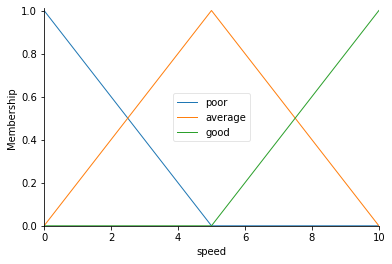

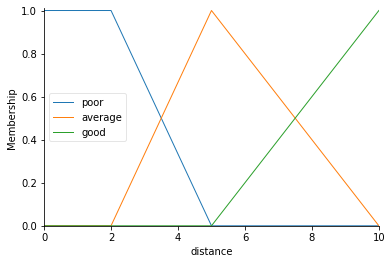

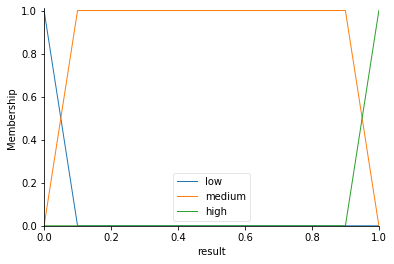

In [6]:
speed.view()
distance.view()
result.view()

In [7]:
tank_ctrl = ctrl.ControlSystem([rule1, rule2, rule3, rule4, rule5, rule6, rule7, rule8, rule9])

In [8]:
wynik = ctrl.ControlSystemSimulation(tank_ctrl)

In [9]:
# Pass inputs to the ControlSystem using Antecedent labels with Pythonic API
# Note: if you like passing many inputs all at once, use .inputs(dict_of_data)
wynik.input['speed'] = 1
wynik.input['distance'] = 1.5
# Crunch the numbers
wynik.compute()

0.9655555555555554


F:\ProgramData\Anaconda3\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


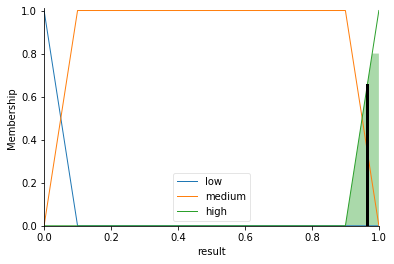

In [10]:
print(wynik.output['result'])
result.view(sim=wynik)

In [11]:
tab = np.arange(0,11,1)
for i in tab:
    wynik.input['speed'] = 10
    wynik.input['distance'] = i
    wynik.compute()
    print(wynik.output['result'])

0.9666666666666667
0.9666666666666667
0.9666666666666667
0.5372134038800707
0.5083820662768032
0.5
0.49491039426523303
0.48999999999999994
0.47444991789819385
0.42415954415954427
0.03333333333333333


In [12]:
vrep.simxFinish(-1) # closes all opened connections, in case any prevoius wasnt finished
clientID=vrep.simxStart('127.0.0.1',19999,True,True,5000,5) # start a connection

if clientID!=-1:
    print ("Connected to remote API server")
else:
    print("Not connected to remote API server")
    sys.exit("Could not connect")

#create instance of Tank
tank=Tank(clientID)

# get handle to proximity sensor
err_code,ps_handle = vrep.simxGetObjectHandle(clientID,"Proximity_sensor", vrep.simx_opmode_blocking)

t = time.time()
speed0 = 10
tank.go()
while (time.time()-t)<80: # 10 seconds of communitation
    #read values from proximity sensor
    
    err_code,detectionState,detectedPoint,detectedObjectHandle,detectedSurfaceNormalVector=vrep.simxReadProximitySensor(clientID,ps_handle,vrep.simx_opmode_streaming)
    distance = np.linalg.norm(detectedPoint)
    # avoid collision
    
    #speed0 = tank.readVelocity()
    wynik.input['speed'] = speed0
    wynik.input['distance'] = distance
    wynik.compute()
    tank.forward(speed0 - speed0 * wynik.output['result'])
    print('Hamowanie',wynik.output['result'],'Dystans',distance,'Predkosc',tank.readVelocity())
    
    
    
    

vrep.simxStopSimulation(clientID,vrep.simx_opmode_oneshot) # stop the simulation in vrep

Connected to remote API server
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Ham

Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.48915582715144196 Dystans 7.175423814591099 Predkosc 5.10844172848558
Hamowanie 0.4891

Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamowanie 0.48907594042805685 Dystans 7.192078202385782 Predkosc 5.109240595719432
Hamo

Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamowanie 0.48888728166542034 Dystans 7.231445570420516 Predkosc 5.111127183345797
Hamo

Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamowanie 0.4887724344993909 Dystans 7.2554359661412615 Predkosc 5.112275655006091
Hamo

Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamowanie 0.4888211015247928 Dystans 7.2452675880106785 Predkosc 5.111788984752072
Hamo

Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892042423130536 Dystans 7.165334963993444 Predkosc 5.107957576869464
Hamowanie 0.4892

Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896

Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896703783855976 Dystans 7.068374361790305 Predkosc 5.103296216144024
Hamowanie 0.4896

Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.48986785999322197 Dystans 7.027391288966769 Predkosc 5.10132140006778
Hamowanie 0.4898

Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902196456319618 Dystans 6.954525607088251 Predkosc 5.097803543680382
Hamowanie 0.4902

Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamowanie 0.49048687940162305 Dystans 6.899292938009093 Predkosc 5.095131205983769
Hamo

Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907106060627317 Dystans 6.853131897423897 Predkosc 5.092893939372683
Hamowanie 0.4907

Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamowanie 0.4908918271782182 Dystans 6.8157939963464464 Predkosc 5.091081728217818
Hamo

Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamowanie 0.49103529655631434 Dystans 6.786267948558768 Predkosc 5.089647034436856
Hamo

Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911634413232569 Dystans 6.759920864000184 Predkosc 5.088365586767431
Hamowanie 0.4911

Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913019788350943 Dystans 6.731463681894708 Predkosc 5.086980211649057
Hamowanie 0.4913

Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.49147467138070555 Dystans 6.69602948952764 Predkosc 5.085253286192945
Hamowanie 0.4914

Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamowanie 0.49166025454479323 Dystans 6.657998328559867 Predkosc 5.083397454552068
Hamo

Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.0815445550075236
Hamowanie 0.49184554449924767 Dystans 6.620076861811837 Predkosc 5.081544555

Hamowanie 0.49205194705918864 Dystans 6.577892828627219 Predkosc 5.079480529408114
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.4921479566008655 Dystans 6.558291587783729 Predkosc 5.078520433991345
Hamowanie 0.492

Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.076947243635057
Hamowanie 0.49230527563649434 Dystans 6.5262021872888205 Predkosc 5.07694724

Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924698553147002 Dystans 6.492669985674318 Predkosc 5.075301446852998
Hamowanie 0.4924

Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamowanie 0.4926543891299899 Dystans 6.455118676969808 Predkosc 5.0734561087001016
Hamo

Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamowanie 0.4928393759749667 Dystans 6.417524437162369 Predkosc 5.0716062402503335
Hamo

Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamowanie 0.49303521203527256 Dystans 6.377779070664252 Predkosc 5.069647879647274
Hamo

Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamowanie 0.49320056125207934 Dystans 6.344264082197327 Predkosc 5.067994387479207
Hamo

Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.49337031931330205 Dystans 6.309896405468182 Predkosc 5.06629680686698
Hamowanie 0.4933

Hamowanie 0.4935448114397338 Dystans 6.274613538868784 Predkosc 5.064551885602662
Hamowanie 0.4935448114397338 Dystans 6.274613538868784 Predkosc 5.064551885602662
Hamowanie 0.4935448114397338 Dystans 6.274613538868784 Predkosc 5.064551885602662
Hamowanie 0.4935448114397338 Dystans 6.274613538868784 Predkosc 5.064551885602662
Hamowanie 0.4935448114397338 Dystans 6.274613538868784 Predkosc 5.064551885602662
Hamowanie 0.4935448114397338 Dystans 6.274613538868784 Predkosc 5.064551885602662
Hamowanie 0.4935448114397338 Dystans 6.274613538868784 Predkosc 5.064551885602662
Hamowanie 0.4935448114397338 Dystans 6.274613538868784 Predkosc 5.064551885602662
Hamowanie 0.4936423309009182 Dystans 6.2549138746874515 Predkosc 5.063576690990818
Hamowanie 0.4936423309009182 Dystans 6.2549138746874515 Predkosc 5.063576690990818
Hamowanie 0.4936423309009182 Dystans 6.2549138746874515 Predkosc 5.063576690990818
Hamowanie 0.4936423309009182 Dystans 6.2549138746874515 Predkosc 5.063576690990818
Hamowanie 0.

Hamowanie 0.49373555140358766 Dystans 6.236095420900256 Predkosc 5.062644485964124
Hamowanie 0.49373555140358766 Dystans 6.236095420900256 Predkosc 5.062644485964124
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamowanie 0.4938262195966923 Dystans 6.217804191994794 Predkosc 5.0617378040330765
Hamo

Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamowanie 0.49401814753168877 Dystans 6.179124007596986 Predkosc 5.059818524683112
Hamo

Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamowanie 0.4942103289262644 Dystans 6.140445794250973 Predkosc 5.0578967107373565
Hamo

Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamowanie 0.49440191338547484 Dystans 6.101940538658745 Predkosc 5.055980866145251
Hamo

Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamowanie 0.49456216310786516 Dystans 6.069773527471463 Predkosc 5.054378368921348
Hamo

Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.0528703443869185
Hamowanie 0.4947129655613081 Dystans 6.0395365453602725 Predkosc 5.052870344

Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.051148810246459
Hamowanie 0.49488511897535414 Dystans 6.0050584402789084 Predkosc 5.05114881

Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamowanie 0.49505580627778134 Dystans 5.970915941582301 Predkosc 5.049441937222187
Hamo

Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952350083427775 Dystans 5.935115202756162 Predkosc 5.047649916572225
Hamowanie 0.4952

Hamowanie 0.49541563586590165 Dystans 5.899076278944612 Predkosc 5.0458436413409835
Hamowanie 0.49541563586590165 Dystans 5.899076278944612 Predkosc 5.0458436413409835
Hamowanie 0.49541563586590165 Dystans 5.899076278944612 Predkosc 5.0458436413409835
Hamowanie 0.49541563586590165 Dystans 5.899076278944612 Predkosc 5.0458436413409835
Hamowanie 0.495506518542942 Dystans 5.8809609892430945 Predkosc 5.04493481457058
Hamowanie 0.495506518542942 Dystans 5.8809609892430945 Predkosc 5.04493481457058
Hamowanie 0.495506518542942 Dystans 5.8809609892430945 Predkosc 5.04493481457058
Hamowanie 0.495506518542942 Dystans 5.8809609892430945 Predkosc 5.04493481457058
Hamowanie 0.495506518542942 Dystans 5.8809609892430945 Predkosc 5.04493481457058
Hamowanie 0.495506518542942 Dystans 5.8809609892430945 Predkosc 5.04493481457058
Hamowanie 0.495506518542942 Dystans 5.8809609892430945 Predkosc 5.04493481457058
Hamowanie 0.495506518542942 Dystans 5.8809609892430945 Predkosc 5.04493481457058
Hamowanie 0.4955

Hamowanie 0.4955967712054169 Dystans 5.862982989766328 Predkosc 5.044032287945831
Hamowanie 0.4955967712054169 Dystans 5.862982989766328 Predkosc 5.044032287945831
Hamowanie 0.4955967712054169 Dystans 5.862982989766328 Predkosc 5.044032287945831
Hamowanie 0.4955967712054169 Dystans 5.862982989766328 Predkosc 5.044032287945831
Hamowanie 0.4955967712054169 Dystans 5.862982989766328 Predkosc 5.044032287945831
Hamowanie 0.4955967712054169 Dystans 5.862982989766328 Predkosc 5.044032287945831
Hamowanie 0.4955967712054169 Dystans 5.862982989766328 Predkosc 5.044032287945831
Hamowanie 0.4955967712054169 Dystans 5.862982989766328 Predkosc 5.044032287945831
Hamowanie 0.4955967712054169 Dystans 5.862982989766328 Predkosc 5.044032287945831
Hamowanie 0.49567980569604003 Dystans 5.846453129971749 Predkosc 5.0432019430396
Hamowanie 0.49567980569604003 Dystans 5.846453129971749 Predkosc 5.0432019430396
Hamowanie 0.49567980569604003 Dystans 5.846453129971749 Predkosc 5.0432019430396
Hamowanie 0.4956798

Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958659100621809 Dystans 5.809440788987668 Predkosc 5.041340899378191
Hamowanie 0.4958

Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamowanie 0.49604042138662696 Dystans 5.774779115282692 Predkosc 5.039595786133731
Hamo

Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962266719364183 Dystans 5.737833859971034 Predkosc 5.037733280635817
Hamowanie 0.4962

Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964300041926361 Dystans 5.697556880146544 Predkosc 5.035699958073639
Hamowanie 0.4964

Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966274310220415 Dystans 5.658506238665998 Predkosc 5.033725689779585
Hamowanie 0.4966

Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamowanie 0.49678202335616384 Dystans 5.627967065197465 Predkosc 5.032179766438362
Hamo

Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamowanie 0.49692312076326867 Dystans 5.600123569785241 Predkosc 5.030768792367313
Hamo

Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970803548247237 Dystans 5.569129238886677 Predkosc 5.029196451752763
Hamowanie 0.4970

Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972473581493601 Dystans 5.536247820650446 Predkosc 5.027526418506399
Hamowanie 0.4972

Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974293234744128 Dystans 5.500465830585536 Predkosc 5.025706765255872
Hamowanie 0.4974

Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 Dystans 5.46324727874229 Predkosc 5.0238115036380595
Hamowanie 0.497618849636194 

Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamowanie 0.49781240430775614 Dystans 5.425290478322724 Predkosc 5.021875956922439
Hamo

Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.01997807511905
Hamowanie 0.498002192488095 Dystans 5.3881241408267 Predkosc 5.0

Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamowanie 0.49817890470334586 Dystans 5.353564603605974 Predkosc 5.018210952966541
Hamo

Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984534920914458 Dystans 5.299951867336013 Predkosc 5.015465079085542
Hamowanie 0.4984

Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.49865509843496497 Dystans 5.26065685925391 Predkosc 5.01344901565035
Hamowanie 0.4986550984349649

Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamowanie 0.4988582722844002 Dystans 5.221114802985707 Predkosc 5.0114172771559975
Hamo

Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990183964120894 Dystans 5.189992501152309 Predkosc 5.009816035879106
Hamowanie 0.4990

Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamowanie 0.4991705487087025 Dystans 5.160453383771648 Predkosc 5.0082945129129754
Hamo

Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamowanie 0.49935606535223176 Dystans 5.124481331028833 Predkosc 5.006439346477682
Hamo

Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamowanie 0.49954157421549766 Dystans 5.088559634155323 Predkosc 5.004584257845023
Hamo

Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamowanie 0.4997142587310584 Dystans 5.0551651038296646 Predkosc 5.002857412689416
Hamo

Hamowanie 0.49989837393046377 Dystans 5.0196066309134215 Predkosc 5.001016260695362
Hamowanie 0.49989837393046377 Dystans 5.0196066309134215 Predkosc 5.001016260695362
Hamowanie 0.49989837393046377 Dystans 5.0196066309134215 Predkosc 5.001016260695362
Hamowanie 0.49989837393046377 Dystans 5.0196066309134215 Predkosc 5.001016260695362
Hamowanie 0.49999220484827944 Dystans 5.001503393738099 Predkosc 5.000077951517206
Hamowanie 0.49999220484827944 Dystans 5.001503393738099 Predkosc 5.000077951517206
Hamowanie 0.49999220484827944 Dystans 5.001503393738099 Predkosc 5.000077951517206
Hamowanie 0.49999220484827944 Dystans 5.001503393738099 Predkosc 5.000077951517206
Hamowanie 0.49999220484827944 Dystans 5.001503393738099 Predkosc 5.000077951517206
Hamowanie 0.49999220484827944 Dystans 5.001503393738099 Predkosc 5.000077951517206
Hamowanie 0.49999220484827944 Dystans 5.001503393738099 Predkosc 5.000077951517206
Hamowanie 0.49999220484827944 Dystans 5.001503393738099 Predkosc 5.000077951517206


Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002721730335427 Dystans 4.968474195366488 Predkosc 4.997278269664573
Hamowanie 0.5002

Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005625395692125 Dystans 4.934771551824567 Predkosc 4.994374604307875
Hamowanie 0.5005

Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004720478424003 Dystans 4.945282561591449 Predkosc 4.995279521575997
Hamowanie 0.5004

Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007549127221408 Dystans 4.912403400763199 Predkosc 4.992450872778592
Hamowanie 0.5007

Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010834489937128 Dystans 4.874130005761527 Predkosc 4.989165510062872
Hamowanie 0.5010

Hamowanie 0.5013163752495007 Dystans 4.846939114774975 Predkosc 4.986836247504993
Hamowanie 0.5013163752495007 Dystans 4.846939114774975 Predkosc 4.986836247504993
Hamowanie 0.5013163752495007 Dystans 4.846939114774975 Predkosc 4.986836247504993
Hamowanie 0.5013163752495007 Dystans 4.846939114774975 Predkosc 4.986836247504993
Hamowanie 0.5013163752495007 Dystans 4.846939114774975 Predkosc 4.986836247504993
Hamowanie 0.5013163752495007 Dystans 4.846939114774975 Predkosc 4.986836247504993
Hamowanie 0.501488246525241 Dystans 4.826845864548578 Predkosc 4.985117534747589
Hamowanie 0.501488246525241 Dystans 4.826845864548578 Predkosc 4.985117534747589
Hamowanie 0.501488246525241 Dystans 4.826845864548578 Predkosc 4.985117534747589
Hamowanie 0.501488246525241 Dystans 4.826845864548578 Predkosc 4.985117534747589
Hamowanie 0.501488246525241 Dystans 4.826845864548578 Predkosc 4.985117534747589
Hamowanie 0.501488246525241 Dystans 4.826845864548578 Predkosc 4.985117534747589
Hamowanie 0.5014882465

Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamowanie 0.5017394181064112 Dystans 4.797436368061207 Predkosc 4.9826058189358875
Hamo

Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamowanie 0.5020948729965827 Dystans 4.7557243257842785 Predkosc 4.979051270034173
Hamo

Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023665760656962 Dystans 4.723767593157238 Predkosc 4.976334239343037
Hamowanie 0.5023

Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969 Dystans 4.68535218033663 Predkosc 4.973075160613031
Hamowanie 0.5026924839386969

Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029743760907567 Dystans 4.652051651309639 Predkosc 4.970256239092433
Hamowanie 0.5029

Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032599213133457 Dystans 4.618250172862827 Predkosc 4.967400786866543
Hamowanie 0.5032

Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamowanie 0.5035730560127695 Dystans 4.581102427185853 Predkosc 4.9642694398723055
Hamo

Hamowanie 0.5038349101733002 Dystans 4.549973604709527 Predkosc 4.961650898266998
Hamowanie 0.5038349101733002 Dystans 4.549973604709527 Predkosc 4.961650898266998
Hamowanie 0.5038349101733002 Dystans 4.549973604709527 Predkosc 4.961650898266998
Hamowanie 0.5038349101733002 Dystans 4.549973604709527 Predkosc 4.961650898266998
Hamowanie 0.5038349101733002 Dystans 4.549973604709527 Predkosc 4.961650898266998
Hamowanie 0.5038349101733002 Dystans 4.549973604709527 Predkosc 4.961650898266998
Hamowanie 0.5040099815795145 Dystans 4.529128554036494 Predkosc 4.959900184204855
Hamowanie 0.5040099815795145 Dystans 4.529128554036494 Predkosc 4.959900184204855
Hamowanie 0.5040099815795145 Dystans 4.529128554036494 Predkosc 4.959900184204855
Hamowanie 0.5040099815795145 Dystans 4.529128554036494 Predkosc 4.959900184204855
Hamowanie 0.5040099815795145 Dystans 4.529128554036494 Predkosc 4.959900184204855
Hamowanie 0.5040099815795145 Dystans 4.529128554036494 Predkosc 4.959900184204855
Hamowanie 0.5040

Hamowanie 0.504184086897583 Dystans 4.5083724280244395 Predkosc 4.95815913102417
Hamowanie 0.504184086897583 Dystans 4.5083724280244395 Predkosc 4.95815913102417
Hamowanie 0.504184086897583 Dystans 4.5083724280244395 Predkosc 4.95815913102417
Hamowanie 0.504184086897583 Dystans 4.5083724280244395 Predkosc 4.95815913102417
Hamowanie 0.504184086897583 Dystans 4.5083724280244395 Predkosc 4.95815913102417
Hamowanie 0.504184086897583 Dystans 4.5083724280244395 Predkosc 4.95815913102417
Hamowanie 0.504184086897583 Dystans 4.5083724280244395 Predkosc 4.95815913102417
Hamowanie 0.504184086897583 Dystans 4.5083724280244395 Predkosc 4.95815913102417
Hamowanie 0.504306263529161 Dystans 4.49379147967227 Predkosc 4.9569373647083905
Hamowanie 0.504306263529161 Dystans 4.49379147967227 Predkosc 4.9569373647083905
Hamowanie 0.504306263529161 Dystans 4.49379147967227 Predkosc 4.9569373647083905
Hamowanie 0.504306263529161 Dystans 4.49379147967227 Predkosc 4.9569373647083905
Hamowanie 0.504306263529161 

Hamowanie 0.504445994427225 Dystans 4.477099824651309 Predkosc 4.95554005572775
Hamowanie 0.504445994427225 Dystans 4.477099824651309 Predkosc 4.95554005572775
Hamowanie 0.504445994427225 Dystans 4.477099824651309 Predkosc 4.95554005572775
Hamowanie 0.504445994427225 Dystans 4.477099824651309 Predkosc 4.95554005572775
Hamowanie 0.5046126575611126 Dystans 4.457169011904407 Predkosc 4.953873424388874
Hamowanie 0.5046126575611126 Dystans 4.457169011904407 Predkosc 4.953873424388874
Hamowanie 0.5046126575611126 Dystans 4.457169011904407 Predkosc 4.953873424388874
Hamowanie 0.5046126575611126 Dystans 4.457169011904407 Predkosc 4.953873424388874
Hamowanie 0.5046126575611126 Dystans 4.457169011904407 Predkosc 4.953873424388874
Hamowanie 0.5046126575611126 Dystans 4.457169011904407 Predkosc 4.953873424388874
Hamowanie 0.5046126575611126 Dystans 4.457169011904407 Predkosc 4.953873424388874
Hamowanie 0.5046126575611126 Dystans 4.457169011904407 Predkosc 4.953873424388874
Hamowanie 0.504612657561

Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053 Dystans 4.42753437732598 Predkosc 4.951399035506947
Hamowanie 0.5048600964493053

Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051591157339229 Dystans 4.391651895581867 Predkosc 4.948408842660771
Hamowanie 0.5051

Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054350293456148 Dystans 4.358473822489076 Predkosc 4.945649706543852
Hamowanie 0.5054

Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamowanie 0.5057547655639568 Dystans 4.3199441328198045 Predkosc 4.942452344360432
Hamo

Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060132989356602 Dystans 4.288725234795135 Predkosc 4.939867010643399
Hamowanie 0.5060

Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063358738260685 Dystans 4.249692238313976 Predkosc 4.936641261739315
Hamowanie 0.5063

Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066003329473145 Dystans 4.217624519764189 Predkosc 4.933996670526854
Hamowanie 0.5066

Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5068996204247083 Dystans 4.1812607471614385 Predkosc 4.931003795752917
Hamowanie 0.5070359522454957 Dystans 4.1646706214533635 Predkosc 4.929640477545043
Hamowanie 0.5070359522454957 Dystans 4.1646706214533635 Predkosc 4.929640477545043
Hamo

Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073515288842634 Dystans 4.126206686805731 Predkosc 4.926484711157366
Hamowanie 0.5073

Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076014310368507 Dystans 4.095686364848546 Predkosc 4.923985689631492
Hamowanie 0.5076

Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079016364130933 Dystans 4.058951118582098 Predkosc 4.920983635869067
Hamowanie 0.5079

Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 Dystans 4.025317810861121 Predkosc 4.918240650208539
Hamowanie 0.508175934979146 

Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamowanie 0.5084448556784948 Dystans 3.9922806591668523 Predkosc 4.915551443215051
Hamo

Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658 Dystans 3.96108382878689 Predkosc 4.913016706686342
Hamowanie 0.5086983293313658

Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.9103714719428995
Hamowanie 0.5089628528057101 Dystans 3.9284676314096236 Predkosc 4.910371471

Hamowanie 0.5092677217059229 Dystans 3.890801504978115 Predkosc 4.907322782940771
Hamowanie 0.5092677217059229 Dystans 3.890801504978115 Predkosc 4.907322782940771
Hamowanie 0.5092677217059229 Dystans 3.890801504978115 Predkosc 4.907322782940771
Hamowanie 0.5092677217059229 Dystans 3.890801504978115 Predkosc 4.907322782940771
Hamowanie 0.5092677217059229 Dystans 3.890801504978115 Predkosc 4.907322782940771
Hamowanie 0.5092677217059229 Dystans 3.890801504978115 Predkosc 4.907322782940771
Hamowanie 0.5092677217059229 Dystans 3.890801504978115 Predkosc 4.907322782940771
Hamowanie 0.5092677217059229 Dystans 3.890801504978115 Predkosc 4.907322782940771
Hamowanie 0.5094086499414682 Dystans 3.8733627666269808 Predkosc 4.905913500585318
Hamowanie 0.5094086499414682 Dystans 3.8733627666269808 Predkosc 4.905913500585318
Hamowanie 0.5094086499414682 Dystans 3.8733627666269808 Predkosc 4.905913500585318
Hamowanie 0.5094086499414682 Dystans 3.8733627666269808 Predkosc 4.905913500585318
Hamowanie 0.

Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096831163318677 Dystans 3.839350278792645 Predkosc 4.903168836681323
Hamowanie 0.5096

Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamowanie 0.5099623066000457 Dystans 3.8046852962609976 Predkosc 4.900376933999543
Hamo

Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamowanie 0.5102446985293615 Dystans 3.7695539150499364 Predkosc 4.897553014706385
Hamo

Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105062830617155 Dystans 3.736949285210858 Predkosc 4.894937169382844
Hamowanie 0.5105

Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107911009979579 Dystans 3.701381136375609 Predkosc 4.892088990020421
Hamowanie 0.5107

Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamowanie 0.5110491589749437 Dystans 3.6690938639452915 Predkosc 4.889508410250563
Hamo

Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamowanie 0.5113630288903823 Dystans 3.6297455189676726 Predkosc 4.886369711096177
Hamo

Hamowanie 0.5116115936092311 Dystans 3.5985233328458186 Predkosc 4.883884063907688
Hamowanie 0.5116115936092311 Dystans 3.5985233328458186 Predkosc 4.883884063907688
Hamowanie 0.5116115936092311 Dystans 3.5985233328458186 Predkosc 4.883884063907688
Hamowanie 0.5117672866683389 Dystans 3.5789393473984483 Predkosc 4.882327133316611
Hamowanie 0.5117672866683389 Dystans 3.5789393473984483 Predkosc 4.882327133316611
Hamowanie 0.5117672866683389 Dystans 3.5789393473984483 Predkosc 4.882327133316611
Hamowanie 0.5117672866683389 Dystans 3.5789393473984483 Predkosc 4.882327133316611
Hamowanie 0.5117672866683389 Dystans 3.5789393473984483 Predkosc 4.882327133316611
Hamowanie 0.5117672866683389 Dystans 3.5789393473984483 Predkosc 4.882327133316611
Hamowanie 0.5117672866683389 Dystans 3.5789393473984483 Predkosc 4.882327133316611
Hamowanie 0.5117672866683389 Dystans 3.5789393473984483 Predkosc 4.882327133316611
Hamowanie 0.5117672866683389 Dystans 3.5789393473984483 Predkosc 4.882327133316611
Hamo

Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120074539765912 Dystans 3.548688298670076 Predkosc 4.879925460234088
Hamowanie 0.5120

Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.87759877684121
Hamowanie 0.512240122315879 Dystans 3.5193338908253 Predkosc 4.8

Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129803041860782 Dystans 3.484584632122025 Predkosc 4.870196958139218
Hamowanie 0.5129

Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamowanie 0.5144800443339052 Dystans 3.4461385649745977 Predkosc 4.855199556660948
Hamo

Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.8423504688248045
Hamowanie 0.5157649531175196 Dystans 3.4142381926794734 Predkosc 4.842350468

Hamowanie 0.5173171282295227 Dystans 3.3769419699253707 Predkosc 4.826828717704773
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamowanie 0.5178584342204163 Dystans 3.364246508344394 Predkosc 4.8214156577958365
Hamo

Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195581557861999 Dystans 3.325399217327385 Predkosc 4.804418442138001
Hamowanie 0.5195

Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208387169280053 Dystans 3.297123712754732 Predkosc 4.791612830719947
Hamowanie 0.5208

Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226869677670007 Dystans 3.257760424574725 Predkosc 4.773130322329992
Hamowanie 0.5226

Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamowanie 0.5241285089102107 Dystans 3.228203131592093 Predkosc 4.7587149108978934
Hamo

Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamowanie 0.5259305061404616 Dystans 3.1926075069574926 Predkosc 4.740694938595384
Hamo

Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458 Dystans 3.16159968089617 Predkosc 4.724366710422542
Hamowanie 0.5275633289577458

Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 Dystans 3.1268180535065504 Predkosc 4.70529646868569
Hamowanie 0.529470353131431 

Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamowanie 0.5308944035022517 Dystans 3.1018103793529366 Predkosc 4.691055964977483
Hamo

Hamowanie 0.5329802050959871 Dystans 3.066602737472743 Predkosc 4.670197949040129
Hamowanie 0.5329802050959871 Dystans 3.066602737472743 Predkosc 4.670197949040129
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowanie 0.5338792183835885 Dystans 3.0519287720816584 Predkosc 4.661207816164115
Hamowa

Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529 Dystans 3.01888299808843 Predkosc 4.640276971512471
Hamowanie 0.5359723028487529

Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamowanie 0.5381103659124387 Dystans 2.9866705318729885 Predkosc 4.618896340875613
Hamo

Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamowanie 0.5403940129935808 Dystans 2.9538901908390858 Predkosc 4.596059870064192
Hamo

Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamowanie 0.5425548609648572 Dystans 2.9243301330408205 Predkosc 4.574451390351428
Hamo

Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 Dystans 2.8887312173757307 Predkosc 4.54702982099057
Hamowanie 0.545297017900943 

Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.5224516674069335
Hamowanie 0.5477548332593066 Dystans 2.8585265205014525 Predkosc 4.522451667

Hamowanie 0.5506392147786707 Dystans 2.8249897558075987 Predkosc 4.493607852213293
Hamowanie 0.5506392147786707 Dystans 2.8249897558075987 Predkosc 4.493607852213293
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.5520365362681524 Dystans 2.809441468104179 Predkosc 4.479634637318476
Hamowanie 0.55

Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.4667866493506745
Hamowanie 0.5533213350649325 Dystans 2.7955280871220975 Predkosc 4.466786649

Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamowanie 0.5564784828793992 Dystans 2.7628188650101393 Predkosc 4.435215171206009
Hamo

Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5596605005765526 Dystans 2.731844384195381 Predkosc 4.403394994234474
Hamowanie 0.5613807463425374 Dystans 2.715875691069745 Predkosc 4.386192536574626
Hamowanie 0.5613

Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamowanie 0.5643704253264753 Dystans 2.6893348270601005 Predkosc 4.356295746735247
Hamo

Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamowanie 0.5677928227857473 Dystans 2.6607154525371377 Predkosc 4.322071772142527
Hamo

Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715664381289233 Dystans 2.63116250846914 Predkosc 4.2843356187107675
Hamowanie 0.5715

Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamowanie 0.5756811833657399 Dystans 2.6011200302077935 Predkosc 4.243188166342601
Hamo

Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.2219380741763555
Hamowanie 0.5778061925823644 Dystans 2.5864266468897874 Predkosc 4.221938074

Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820783467360265 Dystans 2.558444549833664 Predkosc 4.179216532639734
Hamowanie 0.5820

Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867479413100559 Dystans 2.530043214814428 Predkosc 4.132520586899441
Hamowanie 0.5867

Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.1030593286991435
Hamowanie 0.5896940671300857 Dystans 2.5131955009245814 Predkosc 4.103059328

Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamowanie 0.5951816889132915 Dystans 2.4838174306641534 Predkosc 4.048183110867085
Hamo

Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dystans 2.4563093873075195 Predkosc 3.9922768617759994
Hamowanie 0.6007723138224 Dy

Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.9344368726553665
Hamowanie 0.6065563127344633 Dystans 2.4301318796096476 Predkosc 3.934436872

Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamowanie 0.6133237158670711 Dystans 2.402104860060114 Predkosc 3.8667628413292885
Hamo

Hamowanie 0.6170321947259751 Dystans 2.3878132370324345 Predkosc 3.829678052740249
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamowanie 0.6208519451970914 Dystans 2.3738121664159615 Predkosc 3.791480548029086
Hamo

Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamowanie 0.6249529163342707 Dystans 2.359535185456591 Predkosc 3.7504708366572928
Hamo

Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327071053320501 Dystans 2.334480273044713 Predkosc 3.672928946679499
Hamowanie 0.6327

Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamowanie 0.641506383994698 Dystans 2.3087675275716815 Predkosc 3.5849361600530205
Hamo

Hamowanie 0.646867534377849 Dystans 2.294349097378102 Predkosc 3.5313246562215097
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.4850309304428855
Hamowanie 0.6514969069557115 Dystans 2.2825824419508813 Predkosc 3.48503093044

Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6562849280986575 Dystans 2.2710275798330883 Predkosc 3.4371507190134256
Hamowanie 0.6609693959583391 Dystans 2.2602841771886415 Predkosc 3.3903060404166085
Hamowanie 0.6609693959583391 Dystans 2.2602841771886415 Predkosc 3.390306040

Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.3507801018307015
Hamowanie 0.6649219898169298 Dystans 2.2516221224227233 Predkosc 3.350780101

Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamowanie 0.6788880462225025 Dystans 2.2236542677295827 Predkosc 3.211119537774975
Hamo

Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamowanie 0.6888882591205661 Dystans 2.2058367194047177 Predkosc 3.111117408794339
Hamo

Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamowanie 0.7024063742171859 Dystans 2.1842120677162153 Predkosc 2.975936257828141
Hamo

Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 Dystans 2.1599380516138433 Predkosc 2.80251970517066
Hamowanie 0.719748029482934 

Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.6348672217786806
Hamowanie 0.7365132778221319 Dystans 2.1395136170299947 Predkosc 2.634867221

Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.5033838145646046
Hamowanie 0.7496616185435395 Dystans 2.1252338965636692 Predkosc 2.503383814

Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.2778170899074937
Hamowanie 0.7722182910092507 Dystans 2.1036748472730213 Predkosc 2.277817089

Hamowanie 0.7811263198909689 Dystans 2.0960358186678656 Predkosc 2.188736801090311
Hamowanie 0.7811263198909689 Dystans 2.0960358186678656 Predkosc 2.188736801090311
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamowanie 0.7926777930616111 Dystans 2.086768564480039 Predkosc 2.0732220693838883
Hamo

Hamowanie 0.8062596390637817 Dystans 2.076700610657264 Predkosc 1.9374036093621818
Hamowanie 0.8062596390637817 Dystans 2.076700610657264 Predkosc 1.9374036093621818
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamowanie 0.8093687026553341 Dystans 2.074511240606737 Predkosc 1.9063129734466582
Hamo

Hamowanie 0.9303272833673647 Dystans 2.012618692599559 Predkosc 0.6967271663263528
Hamowanie 0.9303272833673647 Dystans 2.012618692599559 Predkosc 0.6967271663263528
Hamowanie 0.9303272833673647 Dystans 2.012618692599559 Predkosc 0.6967271663263528
Hamowanie 0.9303272833673647 Dystans 2.012618692599559 Predkosc 0.6967271663263528
Hamowanie 0.9303272833673647 Dystans 2.012618692599559 Predkosc 0.6967271663263528
Hamowanie 0.946687503359554 Dystans 2.0066955947877214 Predkosc 0.5331249664044595
Hamowanie 0.946687503359554 Dystans 2.0066955947877214 Predkosc 0.5331249664044595
Hamowanie 0.946687503359554 Dystans 2.0066955947877214 Predkosc 0.5331249664044595
Hamowanie 0.946687503359554 Dystans 2.0066955947877214 Predkosc 0.5331249664044595
Hamowanie 0.946687503359554 Dystans 2.0066955947877214 Predkosc 0.5331249664044595
Hamowanie 0.946687503359554 Dystans 2.0066955947877214 Predkosc 0.5331249664044595
Hamowanie 0.946687503359554 Dystans 2.0066955947877214 Predkosc 0.5331249664044595
Hamo

Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.6652150381983049
Hamowanie 0.8334784961801696 Dystans 2.0588262830815567 Predkosc 1.665215038

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dysta

KeyboardInterrupt: 

# Model hamujący agresywnie

In [13]:
# New Antecedent/Consequent objects hold universe variables and membership
# functions
speed = ctrl.Antecedent(np.arange(0, 11, 1), 'speed')
distance = ctrl.Antecedent(np.arange(0, 11, 1), 'distance')
result = ctrl.Consequent(np.arange(0, 1.01, 0.1), 'result')

# Auto-membership function population is possible with .automf(3, 5, or 7)
speed.automf(3)
#distance.automf(3)
distance['poor'] = fuzz.trapmf(distance.universe,[0,0,1,2])
distance['average'] = fuzz.trimf(distance.universe,[1,2,3])
distance['good'] = fuzz.trapmf(distance.universe,[2,3,10,10])


#speed['poor'] = fuzz.trimf(speed.universe,[0,0,3])
#speed['average'] = fuzz.trimf(speed.universe,[1,5,8])
#speed['good'] = fuzz.trimf(speed.universe,[6,10,10])


#distance['poor'] = fuzz.trimf(distance.universe,[0,0,2])
#distance['average'] = fuzz.trimf(distance.universe,[1,5,8])
#distance['good'] = fuzz.trimf(distance.universe,[6,10,10])

# Custom membership functions can be built interactively with a familiar,
# Pythonic API
result['low'] = fuzz.trapmf(result.universe, [0,0.1,0.6,0.7])
result['medium'] = fuzz.trapmf(result.universe,[0.6,0.7,0.9,1])
result['high'] = fuzz.trapmf(result.universe, [0.9,1,1.01,1.01])

rule1 = ctrl.Rule(speed['good'] & distance['poor'], result['high'])
rule2 = ctrl.Rule(speed['good'] & distance['average'], result['medium'])
rule3 = ctrl.Rule(speed['good'] & distance['good'], result['low'])

rule4 = ctrl.Rule(speed['average'] & distance['poor'], result['high'])
rule5 = ctrl.Rule(speed['average'] & distance['average'], result['low'])
rule6 = ctrl.Rule(speed['average'] & distance['good'], result['low'])

rule7 = ctrl.Rule(speed['poor'] & distance['poor'], result['high'])
rule8 = ctrl.Rule(speed['poor'] & distance['average'], result['low'])
rule9 = ctrl.Rule(speed['poor'] & distance['good'], result['low'])

F:\ProgramData\Anaconda3\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
F:\ProgramData\Anaconda3\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
F:\ProgramData\Anaconda3\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


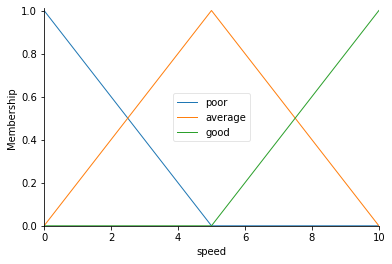

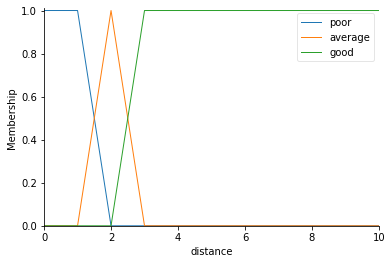

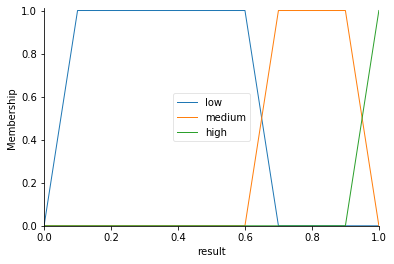

In [14]:
speed.view()
distance.view()
result.view()

In [15]:
tank_ctrl = ctrl.ControlSystem([rule1, rule2, rule3, rule4, rule5, rule6, rule7, rule8, rule9])

In [16]:
wynik = ctrl.ControlSystemSimulation(tank_ctrl)

In [17]:
# Pass inputs to the ControlSystem using Antecedent labels with Pythonic API
# Note: if you like passing many inputs all at once, use .inputs(dict_of_data)
wynik.input['speed'] = 10
wynik.input['distance'] = 0.4
# Crunch the numbers
wynik.compute()

0.9666666666666667


F:\ProgramData\Anaconda3\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


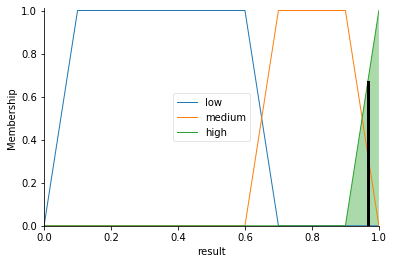

In [18]:
print(wynik.output['result'])
result.view(sim=wynik)

In [19]:
tab = np.arange(0,11,1)
for i in tab:
    wynik.input['speed'] = 9
    wynik.input['distance'] = i
    wynik.compute()
    print(wynik.output['result'])

0.9655555555555554
0.9655555555555554
0.643455497382199
0.3500000000000001
0.3500000000000001
0.3500000000000001
0.3500000000000001
0.3500000000000001
0.3500000000000001
0.3500000000000001
0.3500000000000001


In [20]:
vrep.simxFinish(-1) # closes all opened connections, in case any prevoius wasnt finished
clientID=vrep.simxStart('127.0.0.1',19999,True,True,5000,5) # start a connection

if clientID!=-1:
    print ("Connected to remote API server")
else:
    print("Not connected to remote API server")
    sys.exit("Could not connect")

#create instance of Tank
tank=Tank(clientID)

# get handle to proximity sensor
err_code,ps_handle = vrep.simxGetObjectHandle(clientID,"Proximity_sensor", vrep.simx_opmode_blocking)

t = time.time()
speed0 = 10
tank.go()
while (time.time()-t)<80: # 10 seconds of communitation
    #read values from proximity sensor
    
    err_code,detectionState,detectedPoint,detectedObjectHandle,detectedSurfaceNormalVector=vrep.simxReadProximitySensor(clientID,ps_handle,vrep.simx_opmode_streaming)
    distance = np.linalg.norm(detectedPoint)
    # avoid collision
    
    #speed0 = tank.readVelocity()
    wynik.input['speed'] = speed0
    wynik.input['distance'] = distance
    wynik.compute()
    tank.forward(speed0 - speed0 * wynik.output['result'])
    print('Hamowanie',wynik.output['result'],'Dystans',distance,'Predkosc',tank.readVelocity())
    
    
    
    

vrep.simxStopSimulation(clientID,vrep.simx_opmode_oneshot) # stop the simulation in vrep

Connected to remote API server
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.0 Predkosc 0.3333333333333339
Ham

Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predkosc 6.5
Hamowanie 0.35 Dystans 7.18644792291863 Predko

Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203098964113879 Predkosc 6.5
Hamowanie 0.35 Dystans 7.203

Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248828215190774 Predkosc 6.5
Hamowanie 0.35 Dystans 7.248

Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286964632570571 Predkosc 6.5
Hamowanie 0.35 Dystans 7.286

Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253873840399732 Predkosc 6.5
Hamowanie 0.35 Dystans 7.253

Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154102905633158 Predkosc 6.5
Hamowanie 0.35 Dystans 7.154

Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 0.35 Dystans 7.0444122188005185 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 0.35 Dystans 6.9368938885617855 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predkosc 6.5
Hamowanie 0.35 Dystans 6.85342242332919 Predko

Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 0.35 Dystans 6.7926044407588275 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742022989197208 Predkosc 6.5
Hamowanie 0.35 Dystans 6.742

Hamowanie 0.35 Dystans 6.719133145933284 Predkosc 6.5
Hamowanie 0.35 Dystans 6.719133145933284 Predkosc 6.5
Hamowanie 0.35 Dystans 6.719133145933284 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697628390443519 Predkosc 6.5
Hamowanie 0.35 Dystans 6.697

Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659538783582707 Predkosc 6.5
Hamowanie 0.35 Dystans 6.659

Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626051966945384 Predkosc 6.5
Hamowanie 0.35 Dystans 6.626

Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588753459493502 Predkosc 6.5
Hamowanie 0.35 Dystans 6.588

Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550708420842173 Predkosc 6.5
Hamowanie 0.35 Dystans 6.550

Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509161058286639 Predkosc 6.5
Hamowanie 0.35 Dystans 6.509

Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462473672925158 Predkosc 6.5
Hamowanie 0.35 Dystans 6.462

Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411525307148217 Predkosc 6.5
Hamowanie 0.35 Dystans 6.411

Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364720032305515 Predkosc 6.5
Hamowanie 0.35 Dystans 6.364

Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predkosc 6.5
Hamowanie 0.35 Dystans 6.31859294339842 Predko

Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267819168195719 Predkosc 6.5
Hamowanie 0.35 Dystans 6.267

Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223056848298011 Predkosc 6.5
Hamowanie 0.35 Dystans 6.223

Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176329094576889 Predkosc 6.5
Hamowanie 0.35 Dystans 6.176

Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124849633148701 Predkosc 6.5
Hamowanie 0.35 Dystans 6.124

Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082081774026485 Predkosc 6.5
Hamowanie 0.35 Dystans 6.082

Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predkosc 6.5
Hamowanie 0.35 Dystans 6.04278213711518 Predko

Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998111351231508 Predkosc 6.5
Hamowanie 0.35 Dystans 5.998

Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954033462715877 Predkosc 6.5
Hamowanie 0.35 Dystans 5.954

Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 0.35 Dystans 5.9074394374130055 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863484274073605 Predkosc 6.5
Hamowanie 0.35 Dystans 5.863

Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 0.35 Dystans 5.8178614419783194 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770639630459926 Predkosc 6.5
Hamowanie 0.35 Dystans 5.770

Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720851283850853 Predkosc 6.5
Hamowanie 0.35 Dystans 5.720

Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666599362296403 Predkosc 6.5
Hamowanie 0.35 Dystans 5.666

Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predkosc 6.5
Hamowanie 0.35 Dystans 5.62520978831714 Predko

Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.582314394701963 Predkosc 6.5
Hamowanie 0.35 Dystans 5.563269243745405 Predkosc 6.5
Hamowanie 0.35 Dystans 5.563269243745405 Predkosc 6.5
Hamowanie 0.35 Dystans 5.563269243745405 Predkosc 6.5
Hamowanie 0.35 Dystans 5.563

Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.54430950333609 Predkosc 6.5
Hamowanie 0.35 Dystans 5.518873386946868 Predkosc 6.5
Hamowanie 0.35 Dystans 5.518873386946868 Predkosc 6.5
Hamowanie 0.35 Dystans 5.518873386946868 Predkosc 6.5
Hamowanie 0.35 Dystans 5.518873386946868 Predkosc 6.5
Hamowanie 0.35 Dystans 5.518873386946868 Predkosc 6.5
Hamowanie 0.35 Dystans 5.518873386946868 Predkosc 6.5
Hamowanie 0.35 Dystans 5.518873386946868

Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.499958262338035 Predkosc 6.5
Hamowanie 0.35 Dystans 5.477007471761821 Predkosc 6.5
Hamowanie 0.35 Dystans 5.477007471761821 Predkosc 6.5
Hamowanie 0.35 Dystans 5.477007471761821 Predkosc 6.5
Hamowanie 0.35 Dystans 5.477007471761821 Predkosc 6.5
Hamowanie 0.35 Dystans 5.477007471761821 Predkosc 6.5
Hamowanie 0.35 Dystans 5.477

Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.454089108806632 Predkosc 6.5
Hamowanie 0.35 Dystans 5.43043629814175 Predkosc 6.5
Hamowanie 0.35 Dystans 5.43043629814175 Predkosc 6.5
Hamowanie 0.35 Dystans 5.43043629814175 Predkosc 6.5
Hamowanie 0.35 Dystans 5.43043629814175 Predkosc 6.5
Hamowanie 0.35 Dystans 5.43043629814175 Predkosc 6.5
Hamowanie 0.35 Dystans 5.43043629814175 Predkosc 6.5
Hamowanie 0.35 Dystans 5.430436298

Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406504957594899 Predkosc 6.5
Hamowanie 0.35 Dystans 5.406

Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361026193939367 Predkosc 6.5
Hamowanie 0.35 Dystans 5.361

Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315295046249237 Predkosc 6.5
Hamowanie 0.35 Dystans 5.315

Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259654368975078 Predkosc 6.5
Hamowanie 0.35 Dystans 5.259

Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213201512681748 Predkosc 6.5
Hamowanie 0.35 Dystans 5.213

Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172423512711652 Predkosc 6.5
Hamowanie 0.35 Dystans 5.172

Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predkosc 6.5
Hamowanie 0.35 Dystans 5.12828201713956 Predko

Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.106706038763243 Predkosc 6.5
Hamowanie 0.35 Dystans 5.085678413176649 Predkosc 6.5
Hamowanie 0.35 Dystans 5.085678413176649 Predkosc 6.5
Hamowanie 0.35 Dystans 5.085

Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064774208987568 Predkosc 6.5
Hamowanie 0.35 Dystans 5.064

Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017445679155264 Predkosc 6.5
Hamowanie 0.35 Dystans 5.017

Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977023644694433 Predkosc 6.5
Hamowanie 0.35 Dystans 4.977

Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950188676040096 Predkosc 6.5
Hamowanie 0.35 Dystans 4.950

Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907930520925223 Predkosc 6.5
Hamowanie 0.35 Dystans 4.907

Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854788318456074 Predkosc 6.5
Hamowanie 0.35 Dystans 4.854

Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801982550762355 Predkosc 6.5
Hamowanie 0.35 Dystans 4.801

Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.7776930773590776 Predkosc 6.5
Hamowanie 0.35 Dystans 4.754830967700232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.754830967700232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.754830967700232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.754830967700232 Predkosc 6.5
Hamowanie 0.35

Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735651009750954 Predkosc 6.5
Hamowanie 0.35 Dystans 4.735

Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691550676431807 Predkosc 6.5
Hamowanie 0.35 Dystans 4.691

Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648783859252773 Predkosc 6.5
Hamowanie 0.35 Dystans 4.648

Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.624921592380085 Predkosc 6.5
Hamowanie 0.35 Dystans 4.601140953983722 Predkosc 6.5
Hamowanie 0.35 Dystans 4.601140953983722 Predkosc 6.5
Hamowanie 0.35 Dystans 4.601140953983722 Predkosc 6.5
Hamowanie 0.35 Dystans 4.601140953983722 Predkosc 6.5
Hamowanie 0.35 Dystans 4.601

Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577361196741727 Predkosc 6.5
Hamowanie 0.35 Dystans 4.577

Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530953374405595 Predkosc 6.5
Hamowanie 0.35 Dystans 4.530

Hamowanie 0.35 Dystans 4.464345419192828 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440723246370511 Predkosc 6.5
Hamowanie 0.35 Dystans 4.440

Hamowanie 0.35 Dystans 4.419384311765654 Predkosc 6.5
Hamowanie 0.35 Dystans 4.419384311765654 Predkosc 6.5
Hamowanie 0.35 Dystans 4.419384311765654 Predkosc 6.5
Hamowanie 0.35 Dystans 4.419384311765654 Predkosc 6.5
Hamowanie 0.35 Dystans 4.419384311765654 Predkosc 6.5
Hamowanie 0.35 Dystans 4.419384311765654 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 Predkosc 6.5
Hamowanie 0.35 Dystans 4.39568006599937 

Hamowanie 0.35 Dystans 4.36991588669693 Predkosc 6.5
Hamowanie 0.35 Dystans 4.36991588669693 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.346361214823063 Predkosc 6.5
Hamowanie 0.35 Dystans 4.34636

Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302552107844821 Predkosc 6.5
Hamowanie 0.35 Dystans 4.302

Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257373317812604 Predkosc 6.5
Hamowanie 0.35 Dystans 4.257

Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213397376505665 Predkosc 6.5
Hamowanie 0.35 Dystans 4.213

Hamowanie 0.35 Dystans 4.189689658503232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.189689658503232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.189689658503232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.189689658503232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.189689658503232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.189689658503232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.189689658503232 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dystans 4.1679939589091575 Predkosc 6.5
Hamowanie 0.35 Dy

Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098729452289629 Predkosc 6.5
Hamowanie 0.35 Dystans 4.098

Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 0.35 Dystans 4.0518596927780255 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005915255553061 Predkosc 6.5
Hamowanie 0.35 Dystans 4.005

Hamowanie 0.35 Dystans 3.984751058844959 Predkosc 6.5
Hamowanie 0.35 Dystans 3.984751058844959 Predkosc 6.5
Hamowanie 0.35 Dystans 3.984751058844959 Predkosc 6.5
Hamowanie 0.35 Dystans 3.984751058844959 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35 Dystans 3.9604108765360007 Predkosc 6.5
Hamowanie 0.35

Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935294686271668 Predkosc 6.5
Hamowanie 0.35 Dystans 3.935

Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 0.35 Dystans 3.8885133378950596 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845338282788123 Predkosc 6.5
Hamowanie 0.35 Dystans 3.845

Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803095765257547 Predkosc 6.5
Hamowanie 0.35 Dystans 3.803

Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7813017293433666 Predkosc 6.5
Hamowanie 0.35 Dystans 3.75780107465192 Predkosc 6.5
Hamowanie 0.35 Dystans 3.75780107465192 Predkosc 6.5
Hamowanie 0.35 Dystans 3.75780107465192 Predkosc 6.5
Hamowanie 0.35 Dystans 3.75780107465192 Predkosc 6.5
Hamowanie 0.35 Dystans 3.75780107465192 Predkosc 6.5
Hamowanie 0.35 Dysta

Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 0.35 Dystans 3.7362827901051023 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687233191237895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.687

Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638817283692486 Predkosc 6.5
Hamowanie 0.35 Dystans 3.638

Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5924492351788557 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 3.569311259421895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.569311259421895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.569311259421895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.569311259421895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.569311259421895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.569311259421895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.569311259421895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.569311259421895 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547871360239195 Predkosc 6.5
Hamowanie 0.35 Dystans 3.547

Hamowanie 0.35 Dystans 3.5233714655684705 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5233714655684705 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5233714655684705 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5233714655684705 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5233714655684705 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5233714655684705 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5233714655684705 Predkosc 6.5
Hamowanie 0.35 Dystans 3.5233714655684705 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dystans 3.498133840849864 Predkosc 6.5
Hamowanie 0.35 Dysta

Hamowanie 0.35 Dystans 3.473436487640689 Predkosc 6.5
Hamowanie 0.35 Dystans 3.473436487640689 Predkosc 6.5
Hamowanie 0.35 Dystans 3.473436487640689 Predkosc 6.5
Hamowanie 0.35 Dystans 3.473436487640689 Predkosc 6.5
Hamowanie 0.35 Dystans 3.473436487640689 Predkosc 6.5
Hamowanie 0.35 Dystans 3.473436487640689 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4509102119767237 Predkosc 6.5
Hamowanie 0.35 D

Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 0.35 Dystans 3.4084268177638983 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364108289496271 Predkosc 6.5
Hamowanie 0.35 Dystans 3.364

Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318863223982617 Predkosc 6.5
Hamowanie 0.35 Dystans 3.318

Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2735432070056047 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 0.35 Dystans 3.2279239075098363 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 0.35 Dystans 3.1816282868405406 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135487924785259 Predkosc 6.5
Hamowanie 0.35 Dystans 3.135

Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0895883829490236 Predkosc 6.5
Hamowanie 

Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 0.35 Dystans 3.0411013733986345 Predkosc 6.5
Hamowanie 

Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.491764157984777
Hamowanie 0.35082358420152226 Dystans 2.9970199275629055 Predkosc 6.49176415

Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamowanie 0.3625830162652954 Dystans 2.9544394279311135 Predkosc 6.374169837347046
Hamo

Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.249480959363103
Hamowanie 0.37505190406368966 Dystans 2.9093499086226213 Predkosc 6.24948095

Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamowanie 0.3871208116570372 Dystans 2.8659420046357713 Predkosc 6.128791883429628
Hamo

Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamowanie 0.39918980998208964 Dystans 2.822942542991052 Predkosc 6.008101900179104
Hamo

Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115179376737366 Dystans 2.779621640635653 Predkosc 5.884820623262634
Hamowanie 0.4115

Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.753794809657914
Hamowanie 0.42462051903420855 Dystans 2.7344416839307137 Predkosc 5.75379480

Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamowanie 0.4382376243789108 Dystans 2.6886342850725473 Predkosc 5.617623756210892
Hamo

Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.4830816074384225
Hamowanie 0.45169183925615775 Dystans 2.644709312795162 Predkosc 5.483081607

Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamowanie 0.46487741194333415 Dystans 2.603099796262425 Predkosc 5.351225880566658
Hamo

Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769603045157481 Dystans 2.566320879873797 Predkosc 5.230396954842519
Hamowanie 0.4769

Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.1238941757986165
Hamowanie 0.4876105824201384 Dystans 2.5350293963215824 Predkosc 5.123894175

Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamowanie 0.5001010839406597 Dystans 2.4997428075735217 Predkosc 4.998989160593403
Hamo

Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154192411368272 Dystans 2.461477573757412 Predkosc 4.845807588631727
Hamowanie 0.5154

Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 Dystans 2.4256469986386264 Predkosc 4.69678605080269
Hamowanie 0.530321394919731 

Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453949078438107 Dystans 2.390850577524109 Predkosc 4.546050921561893
Hamowanie 0.5453

Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamowanie 0.5606373180169173 Dystans 2.3571674227884194 Predkosc 4.393626819830827
Hamo

Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756529647125485 Dystans 2.325467327451245 Predkosc 4.243470352874516
Hamowanie 0.5756

Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamowanie 0.5887178273699712 Dystans 2.2990725510702332 Predkosc 4.112821726300288
Hamo

Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.9585087841738975
Hamowanie 0.6041491215826102 Dystans 2.2692951414037847 Predkosc 3.958508784

Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamowanie 0.6202169448769121 Dystans 2.2398577800646735 Predkosc 3.797830551230879
Hamo

Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamowanie 0.6368810916075721 Dystans 2.2109593143829667 Predkosc 3.631189083924279
Hamo

Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.4678970609252655
Hamowanie 0.6532102939074734 Dystans 2.1841855422356566 Predkosc 3.467897060

Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamowanie 0.6698107068092886 Dystans 2.158458669543356 Predkosc 3.3018929319071146
Hamo

Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6869889222091046 Dystans 2.1333360791102582 Predkosc 3.1301107779089543
Hamowanie 0.6950038591306333 Dystans 2.1221118356318813 Predkosc 3.049961408693667
Hamowanie 0.6950038591306333 Dystans 2.1221118356318813 Predkosc 3.0499614086

Hamowanie 0.7028116544774612 Dystans 2.111470138288537 Predkosc 2.971883455225388
Hamowanie 0.7028116544774612 Dystans 2.111470138288537 Predkosc 2.971883455225388
Hamowanie 0.7028116544774612 Dystans 2.111470138288537 Predkosc 2.971883455225388
Hamowanie 0.7028116544774612 Dystans 2.111470138288537 Predkosc 2.971883455225388
Hamowanie 0.7098566773378445 Dystans 2.1021089061339064 Predkosc 2.9014332266215543
Hamowanie 0.7098566773378445 Dystans 2.1021089061339064 Predkosc 2.9014332266215543
Hamowanie 0.7098566773378445 Dystans 2.1021089061339064 Predkosc 2.9014332266215543
Hamowanie 0.7098566773378445 Dystans 2.1021089061339064 Predkosc 2.9014332266215543
Hamowanie 0.7098566773378445 Dystans 2.1021089061339064 Predkosc 2.9014332266215543
Hamowanie 0.7098566773378445 Dystans 2.1021089061339064 Predkosc 2.9014332266215543
Hamowanie 0.7098566773378445 Dystans 2.1021089061339064 Predkosc 2.9014332266215543
Hamowanie 0.7098566773378445 Dystans 2.1021089061339064 Predkosc 2.9014332266215543


Hamowanie 0.7170011898164727 Dystans 2.092842469158309 Predkosc 2.8299881018352737
Hamowanie 0.7170011898164727 Dystans 2.092842469158309 Predkosc 2.8299881018352737
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dystans 2.0827185729951 Predkosc 2.749894796671713
Hamowanie 0.7250105203328288 Dysta

Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.742768034658298 Dystans 2.061227575490877 Predkosc 2.5723196534170203
Hamowanie 0.7427

Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.4046368779633944
Hamowanie 0.7595363122036606 Dystans 2.0420763885014757 Predkosc 2.404636877

Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775778577375757 Dystans 2.022626616889578 Predkosc 2.224221422624243
Hamowanie 0.7775

Hamowanie 0.7867830512915731 Dystans 2.013137800581428 Predkosc 2.132169487084269
Hamowanie 0.7867830512915731 Dystans 2.013137800581428 Predkosc 2.132169487084269
Hamowanie 0.7867830512915731 Dystans 2.013137800581428 Predkosc 2.132169487084269
Hamowanie 0.7867830512915731 Dystans 2.013137800581428 Predkosc 2.132169487084269
Hamowanie 0.7867830512915731 Dystans 2.013137800581428 Predkosc 2.132169487084269
Hamowanie 0.7867830512915731 Dystans 2.013137800581428 Predkosc 2.132169487084269
Hamowanie 0.7969823317566983 Dystans 2.0029504041643746 Predkosc 2.0301766824330167
Hamowanie 0.7969823317566983 Dystans 2.0029504041643746 Predkosc 2.0301766824330167
Hamowanie 0.7969823317566983 Dystans 2.0029504041643746 Predkosc 2.0301766824330167
Hamowanie 0.7969823317566983 Dystans 2.0029504041643746 Predkosc 2.0301766824330167
Hamowanie 0.7969823317566983 Dystans 2.0029504041643746 Predkosc 2.0301766824330167
Hamowanie 0.7969823317566983 Dystans 2.0029504041643746 Predkosc 2.0301766824330167
Hamo

Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.9966963601013639
Hamowanie 0.8003303639898636 Dystans 1.9880644124250721 Predkosc 1.996696360

Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.9942131184896486
Hamowanie 0.8005786881510352 Dystans 1.9790367568278284 Predkosc 1.994213118

Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.800790770226848 Dystans 1.971288466198364 Predkosc 1.9920922977315207
Hamowanie 0.8007

Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010893139948843 Dystans 1.960321570905314 Predkosc 1.989106860051157
Hamowanie 0.8010

Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.9845739523069987
Hamowanie 0.8015426047693002 Dystans 1.9435360357069136 Predkosc 1.984573952

Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.9802599088239514
Hamowanie 0.8019740091176049 Dystans 1.9274102552511398 Predkosc 1.980259908

Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dystans 1.9120293826720458 Predkosc 1.9761814487639988
Hamowanie 0.8023818551236 Dy

Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.9718595345755237
Hamowanie 0.8028140465424477 Dystans 1.8955859149933072 Predkosc 1.971859534

Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.9670199521390117
Hamowanie 0.8032980047860988 Dystans 1.8769958024432096 Predkosc 1.967019952

Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.9632680960878837
Hamowanie 0.8036731903912117 Dystans 1.8624547470108939 Predkosc 1.963268096

Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.9607745799609635
Hamowanie 0.8039225420039037 Dystans 1.8527280458850024 Predkosc 1.960774579

Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamowanie 0.8042443918868508 Dystans 1.840099276343134 Predkosc 1.9575560811314912
Hamo

Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.9538706456346269
Hamowanie 0.8046129354365372 Dystans 1.8255356156280216 Predkosc 1.953870645

Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.9497755391881846
Hamowanie 0.8050224460811815 Dystans 1.8092241200805443 Predkosc 1.949775539

Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.9482890813265552
Hamowanie 0.8051710918673445 Dystans 1.8032696662993197 Predkosc 1.948289081

Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamowanie 0.8054702694271586 Dystans 1.791230788323712 Predkosc 1.9452973057284133
Hamo

Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.9414350587763014
Hamowanie 0.8058564941223699 Dystans 1.7755814420445344 Predkosc 1.941435058

Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamowanie 0.8060229775404488 Dystans 1.768798245252684 Predkosc 1.9397702245955113
Hamo

Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063956252335358 Dystans 1.753533099495806 Predkosc 1.936043747664641
Hamowanie 0.8063

Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.9328662599956932
Hamowanie 0.8067133740004307 Dystans 1.7404271761168695 Predkosc 1.932866259

Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068355843444321 Dystans 1.735364463490978 Predkosc 1.931644156555679
Hamowanie 0.8068

Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.9291170166975444
Hamowanie 0.8070882983302455 Dystans 1.7248566663365241 Predkosc 1.929117016

Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.9257918045276323
Hamowanie 0.8074208195472368 Dystans 1.7109507074798815 Predkosc 1.925791804

Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamowanie 0.8078005767262864 Dystans 1.6949583043411123 Predkosc 1.921994232737136
Hamo

Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.9198065253273366
Hamowanie 0.8080193474672663 Dystans 1.6856915759051083 Predkosc 1.919806525

Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.9167582046214946
Hamowanie 0.8083241795378506 Dystans 1.6727137840750492 Predkosc 1.916758204

Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.9136596495355676
Hamowanie 0.8086340350464433 Dystans 1.6594437066182175 Predkosc 1.913659649

Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.9106242560998936
Hamowanie 0.8089375743900107 Dystans 1.6463674072100134 Predkosc 1.910624256

Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091663773003483 Dystans 1.636460486566041 Predkosc 1.908336226996516
Hamowanie 0.8091

Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.9052106978270018
Hamowanie 0.8094789302172998 Dystans 1.6228574707497554 Predkosc 1.905210697

Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.9027329855254287
Hamowanie 0.8097267014474571 Dystans 1.6120165949556804 Predkosc 1.902732985

Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamowanie 0.8100930476663939 Dystans 1.595894730322309 Predkosc 1.8990695233360615
Hamo

Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.8968724708580122
Hamowanie 0.8103127529141988 Dystans 1.5861729300650005 Predkosc 1.896872470

Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamowanie 0.8107349666355635 Dystans 1.567378276430457 Predkosc 1.8926503336443652
Hamo

Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.8891503644547463
Hamowanie 0.8110849635545253 Dystans 1.5516866146570305 Predkosc 1.889150364

Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.8878269406598829
Hamowanie 0.8112173059340118 Dystans 1.5457268286863424 Predkosc 1.887826940

Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamowanie 0.8113845957108375 Dystans 1.5381725342918613 Predkosc 1.886154042891624
Hamo

Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.8829367989889718
Hamowanie 0.8117063201011028 Dystans 1.5235794174992336 Predkosc 1.882936798

Hamowanie 0.8119004338820772 Dystans 1.5147332155602353 Predkosc 1.8809956611792273
Hamowanie 0.8119004338820772 Dystans 1.5147332155602353 Predkosc 1.8809956611792273
Hamowanie 0.8119004338820772 Dystans 1.5147332155602353 Predkosc 1.8809956611792273
Hamowanie 0.8119004338820772 Dystans 1.5147332155602353 Predkosc 1.8809956611792273
Hamowanie 0.8119004338820772 Dystans 1.5147332155602353 Predkosc 1.8809956611792273
Hamowanie 0.8119004338820772 Dystans 1.5147332155602353 Predkosc 1.8809956611792273
Hamowanie 0.8119004338820772 Dystans 1.5147332155602353 Predkosc 1.8809956611792273
Hamowanie 0.8119004338820772 Dystans 1.5147332155602353 Predkosc 1.8809956611792273
Hamowanie 0.8119004338820772 Dystans 1.5147332155602353 Predkosc 1.8809956611792273
Hamowanie 0.8120954877124054 Dystans 1.5058128065187237 Predkosc 1.8790451228759473
Hamowanie 0.8120954877124054 Dystans 1.5058128065187237 Predkosc 1.8790451228759473
Hamowanie 0.8120954877124054 Dystans 1.5058128065187237 Predkosc 1.879045122

Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8124799011097057 Dystans 1.497301142692266 Predkosc 1.875200988902943
Hamowanie 0.8132044919833655 Dystans 1.4897782507513295 Predkosc 1.867955080166345
Hamowanie 0.8132044919833655 Dystans 1.4897782507513295 Predkosc 1.867955080166345
Hamowanie 0.81

Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamowanie 0.8138011415685548 Dystans 1.4836572894517535 Predkosc 1.861988584314453
Hamo

Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamowanie 0.8152295756093473 Dystans 1.469274203591614 Predkosc 1.8477042439065272
Hamo

Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.81682368444945 Dystans 1.4536753170873402 Predkosc 1.8317631555055005
Hamowanie 0.8168

Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.8175061224184752
Hamowanie 0.8182493877581525 Dystans 1.4401281642912265 Predkosc 1.817506122

Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamowanie 0.8196521969786988 Dystans 1.4271689582303724 Predkosc 1.803478030213011
Hamo

Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.7956959342055452
Hamowanie 0.8204304065794454 Dystans 1.4201372593368438 Predkosc 1.795695934

Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.821501315425235 Dystans 1.410643075880027 Predkosc 1.7849868457476497
Hamowanie 0.8215

Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.7676875425093979
Hamowanie 0.8232312457490603 Dystans 1.3957476176952577 Predkosc 1.767687542

Hamowanie 0.8242024719273787 Dystans 1.3876207960689753 Predkosc 1.7579752807262121
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.7470712492304337
Hamowanie 0.8252928750769566 Dystans 1.3786958636579993 Predkosc 1.747071249

Hamowanie 0.8264044408285388 Dystans 1.3698115044120494 Predkosc 1.7359555917146121
Hamowanie 0.8264044408285388 Dystans 1.3698115044120494 Predkosc 1.7359555917146121
Hamowanie 0.8264044408285388 Dystans 1.3698115044120494 Predkosc 1.7359555917146121
Hamowanie 0.8264044408285388 Dystans 1.3698115044120494 Predkosc 1.7359555917146121
Hamowanie 0.8274467724067631 Dystans 1.3616735931693456 Predkosc 1.7255322759323697
Hamowanie 0.8274467724067631 Dystans 1.3616735931693456 Predkosc 1.7255322759323697
Hamowanie 0.8274467724067631 Dystans 1.3616735931693456 Predkosc 1.7255322759323697
Hamowanie 0.8274467724067631 Dystans 1.3616735931693456 Predkosc 1.7255322759323697
Hamowanie 0.8274467724067631 Dystans 1.3616735931693456 Predkosc 1.7255322759323697
Hamowanie 0.8274467724067631 Dystans 1.3616735931693456 Predkosc 1.7255322759323697
Hamowanie 0.8274467724067631 Dystans 1.3616735931693456 Predkosc 1.7255322759323697
Hamowanie 0.8274467724067631 Dystans 1.3616735931693456 Predkosc 1.725532275

Hamowanie 0.8283001989035305 Dystans 1.3551475616971602 Predkosc 1.716998010964696
Hamowanie 0.8283001989035305 Dystans 1.3551475616971602 Predkosc 1.716998010964696
Hamowanie 0.8283001989035305 Dystans 1.3551475616971602 Predkosc 1.716998010964696
Hamowanie 0.8283001989035305 Dystans 1.3551475616971602 Predkosc 1.716998010964696
Hamowanie 0.8283001989035305 Dystans 1.3551475616971602 Predkosc 1.716998010964696
Hamowanie 0.8283001989035305 Dystans 1.3551475616971602 Predkosc 1.716998010964696
Hamowanie 0.8292514582134296 Dystans 1.3480165807963818 Predkosc 1.7074854178657048
Hamowanie 0.8292514582134296 Dystans 1.3480165807963818 Predkosc 1.7074854178657048
Hamowanie 0.8292514582134296 Dystans 1.3480165807963818 Predkosc 1.7074854178657048
Hamowanie 0.8292514582134296 Dystans 1.3480165807963818 Predkosc 1.7074854178657048
Hamowanie 0.8292514582134296 Dystans 1.3480165807963818 Predkosc 1.7074854178657048
Hamowanie 0.8292514582134296 Dystans 1.3480165807963818 Predkosc 1.707485417865704

Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamowanie 0.830355704468847 Dystans 1.3399249259180563 Predkosc 1.6964429553115306
Hamo

Hamowanie 0.8322294672810153 Dystans 1.326641424377221 Predkosc 1.6777053271898463
Hamowanie 0.8322294672810153 Dystans 1.326641424377221 Predkosc 1.6777053271898463
Hamowanie 0.8322294672810153 Dystans 1.326641424377221 Predkosc 1.6777053271898463
Hamowanie 0.8322294672810153 Dystans 1.326641424377221 Predkosc 1.6777053271898463
Hamowanie 0.8322294672810153 Dystans 1.326641424377221 Predkosc 1.6777053271898463
Hamowanie 0.8322294672810153 Dystans 1.326641424377221 Predkosc 1.6777053271898463
Hamowanie 0.8322294672810153 Dystans 1.326641424377221 Predkosc 1.6777053271898463
Hamowanie 0.83287031823591 Dystans 1.3222244654222826 Predkosc 1.6712968176409007
Hamowanie 0.83287031823591 Dystans 1.3222244654222826 Predkosc 1.6712968176409007
Hamowanie 0.83287031823591 Dystans 1.3222244654222826 Predkosc 1.6712968176409007
Hamowanie 0.83287031823591 Dystans 1.3222244654222826 Predkosc 1.6712968176409007
Hamowanie 0.83287031823591 Dystans 1.3222244654222826 Predkosc 1.6712968176409007
Hamowanie

Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.6649227294151991
Hamowanie 0.8335077270584801 Dystans 1.3178937136868962 Predkosc 1.664922729

Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamowanie 0.8351035173121208 Dystans 1.307319422066515 Predkosc 1.6489648268787924
Hamo

Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamowanie 0.836162975635408 Dystans 1.3005057914793072 Predkosc 1.6383702436459195
Hamo

Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.6250706159930566
Hamowanie 0.8374929384006944 Dystans 1.2921793854833519 Predkosc 1.625070615

Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397584556555863 Dystans 1.278557580694051 Predkosc 1.602415443444137
Hamowanie 0.8397

Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamowanie 0.8424902576694894 Dystans 1.2630287821721415 Predkosc 1.575097423305106
Hamo

Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.5473636903285684
Hamowanie 0.8452636309671432 Dystans 1.2482059938232553 Predkosc 1.547363690

Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473893604964923 Dystans 1.237448129592317 Predkosc 1.526106395035077
Hamowanie 0.8473

Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamowanie 0.8484411286521233 Dystans 1.2323095128096604 Predkosc 1.515588713478767
Hamo

Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.5069075471354392
Hamowanie 0.8493092452864561 Dystans 1.2281568774948362 Predkosc 1.506907547

Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamowanie 0.8502521156885388 Dystans 1.2237353371870163 Predkosc 1.497478843114612
Hamo

Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamowanie 0.8536953086921606 Dystans 1.208338265221562 Predkosc 1.4630469130783936
Hamo

Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamowanie 0.8570284563447513 Dystans 1.194481667425546 Predkosc 1.4297154365524865
Hamo

Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.3998876519890313
Hamowanie 0.8600112348010969 Dystans 1.1828841358846534 Predkosc 1.399887651

Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.3814388774825446
Hamowanie 0.8618561122517455 Dystans 1.1760639335392558 Predkosc 1.381438877

Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.3753345190786028
Hamowanie 0.8624665480921397 Dystans 1.1738638617991426 Predkosc 1.375334519

Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.3460186159562468
Hamowanie 0.8653981384043754 Dystans 1.1636721775215801 Predkosc 1.346018615

Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.2909090319582521
Hamowanie 0.8709090968041748 Dystans 1.1460628712915788 Predkosc 1.290909031

Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.2492526379388522
Hamowanie 0.8750747362061148 Dystans 1.1339557691298956 Predkosc 1.249252637

Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamowanie 0.8787170285306655 Dystans 1.124126679831405 Predkosc 1.2128297146933456
Hamo

Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.1837935114337412
Hamowanie 0.8816206488566259 Dystans 1.1167529238385208 Predkosc 1.183793511

Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamowanie 0.8824875321569948 Dystans 1.1146261109869444 Predkosc 1.175124678430052
Hamo

Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.882663642353103 Dystans 1.1141981007041173 Predkosc 1.1733635764689705
Hamowanie 0.8832440393759415 Dystans 1.1127971028864512 Predkosc 1.1675596062405837
Ham

Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.1537001451107507
Hamowanie 0.8846299854889249 Dystans 1.1095100040836963 Predkosc 1.153700145

Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.1102699038503534
Hamowanie 0.8889730096149646 Dystans 1.0997159776753107 Predkosc 1.110269903

Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.0424409957371221
Hamowanie 0.8957559004262877 Dystans 1.0858106043739064 Predkosc 1.042440995

Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.9713579145952664
Hamowanie 0.9028642085404734 Dystans 1.0728168337569175 Predkosc 0.971357914

Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.9153060478682633
Hamowanie 0.9084693952131737 Dystans 1.0635529196040865 Predkosc 0.915306047

Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.8707667862014858
Hamowanie 0.9129233213798513 Dystans 1.0567356863952264 Predkosc 0.870766786

Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.8386290199851665
Hamowanie 0.9161370980014834 Dystans 1.0520886290804117 Predkosc 0.838629019

Hamowanie 0.9161234158201909 Dystans 1.0521079554447705 Predkosc 0.8387658417980912
Hamowanie 0.9161234158201909 Dystans 1.0521079554447705 Predkosc 0.8387658417980912
Hamowanie 0.9161234158201909 Dystans 1.0521079554447705 Predkosc 0.8387658417980912
Hamowanie 0.8933406370853277 Dystans 1.0905807778936532 Predkosc 1.0665936291467233
Hamowanie 0.8933406370853277 Dystans 1.0905807778936532 Predkosc 1.0665936291467233
Hamowanie 0.8933406370853277 Dystans 1.0905807778936532 Predkosc 1.0665936291467233
Hamowanie 0.8933406370853277 Dystans 1.0905807778936532 Predkosc 1.0665936291467233
Hamowanie 0.8933406370853277 Dystans 1.0905807778936532 Predkosc 1.0665936291467233
Hamowanie 0.8933406370853277 Dystans 1.0905807778936532 Predkosc 1.0665936291467233
Hamowanie 0.8933406370853277 Dystans 1.0905807778936532 Predkosc 1.0665936291467233
Hamowanie 0.8933406370853277 Dystans 1.0905807778936532 Predkosc 1.0665936291467233
Hamowanie 0.8933406370853277 Dystans 1.0905807778936532 Predkosc 1.066593629

Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.0553701347998583
Hamowanie 0.8944629865200142 Dystans 1.0883402490354712 Predkosc 1.055370134

Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905 Dystans 1.08668951958328 Predkosc 1.046964665339095
Hamowanie 0.8953035334660905

Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975356102955683 Dystans 1.08241562322435 Predkosc 1.0246438970443172
Hamowanie 0.8975

Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamowanie 0.8997243468839642 Dystans 1.078373264851744 Predkosc 1.0027565311603581
Hamo

Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamowanie 0.9013586967738677 Dystans 1.075446399828514 Predkosc 0.9864130322613232
Hamo

Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.9821563588598643
Hamowanie 0.9017843641140136 Dystans 1.0746965446431227 Predkosc 0.982156358

Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.9800158854983074
Hamowanie 0.9019984114501693 Dystans 1.0743213899800035 Predkosc 0.980015885

Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.9620006170546187
Hamowanie 0.9037999382945382 Dystans 1.0712136673500632 Predkosc 0.962000617

Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamowanie 0.9075640915263089 Dystans 1.064995486226214 Predkosc 0.9243590847369116
Hamo

Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.7065529045766876
Hamowanie 0.9293447095423312 Dystans 1.0350679393472269 Predkosc 0.706552904

Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamowanie 0.9480923147184106 Dystans 1.015491480991977 Predkosc 0.5190768528158944
Hamo

Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.988210724853429 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9442862272544811 Dystans 1.0191028970160894 Predkosc 0.5571377274551885
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9659697603981771 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9515678461428106 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9439672457010079 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945670412130791 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9508258746546907 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9580740591710246 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9568417818454991 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9497984136202545 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.946487057706727 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.945928056739774 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9426848575178747 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9352458361990513 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9315366007686907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9315366007686907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9315366007686907 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9285719504855737 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9285719504855737 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9285719504855737 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9285719504855737 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9285719504855737 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9285719504855737 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9285719504855737 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9285719504855737 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9285719504855737 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9263022245579098 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9251385276266483 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.927283353418064 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.921958788613867 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.921958788613867 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.921958788613867 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.921958788613867 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.921958788613867 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.921958788613867 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.923106767679923 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.923106767679923 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.923106767679923 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.923106767679923 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.923106767679923 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.923106767679923 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9236302359710342 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9228498880089765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9228498880089765 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9208772355243118 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9208772355243118 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9180359713328766 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9145348062004558 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9145348062004558 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9109574876920888 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9069699131533062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9069699131533062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9069699131533062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9069699131533062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9069699131533062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9069699131533062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9069699131533062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9069699131533062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9031614982017687 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9031614982017687 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9031614982017687 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9031614982017687 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9061067661458315 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9025787711876567 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8964634011877267 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9029539727429906 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9029539727429906 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9029539727429906 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9029539727429906 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9029539727429906 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9029539727429906 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9029539727429906 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9029539727429906 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9029539727429906 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9018062786954695 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9018062786954695 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9018062786954695 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8955264773530259 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899747291581601 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8880590111258627 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8899140223989712 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.891319470013194 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8902851659403775 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8878565782741213 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8861094115945718 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8803869530676239 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8893408825445922 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8892725060336305 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8884100089072026 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8884100089072026 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8884100089072026 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8884100089072026 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8884100089072026 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8884100089072026 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8884100089072026 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.887238503216401 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.887238503216401 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.887238503216401 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.887238503216401 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.887238503216401 Predkosc 0.33333333333333

Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8856371807822895 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8757257009914535 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8743372010998849 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8734743831036791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734743831036791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734743831036791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734743831036791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734743831036791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734743831036791 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8730159747931513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8730159747931513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8730159747931513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8730159747931513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8730159747931513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8730159747931513 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8727745219951343 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8799753678790262 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8820623037290172 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8855993210206498 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8846600225574865 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8749500256965108 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8734575700339557 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8728125551936172 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8676377516296634 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.9011922623887205 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8930829264570561 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8376643356431349 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8297525101306287 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.824852096917649 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.827234977967809 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.827234977967809 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.827234977967809 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.827234977967809 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8223369896628369 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8223369896628369 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8223369896628369 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8223369896628369 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8223369896628369 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8223369896628369 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8223369896628369 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8223369896628369 Predkosc 0.3333333333333

Hamowanie 0.9666666666666667 Dystans 0.8183724437859262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8183724437859262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8183724437859262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8183724437859262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8183724437859262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8183724437859262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8183724437859262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8183724437859262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165754091625805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165754091625805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165754091625805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165754091625805 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8164670608453016 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8134970387356595 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8165294907576574 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8129994293949259 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8089680755594726 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.809047417994902 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8115533048798764 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8133781163447901 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8126875564135894 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8105587379913395 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8093274069092012 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8093274069092012 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8081980433078332 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8071928938402706 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8061268214845814 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8062911107722983 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8065547702305005 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.806453199739515 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8056802375689937 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048558371228068 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.804114151602327 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8030381014221679 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8021498350482388 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8025526268618037 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8048854256695164 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8083487348190083 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8109189396540039 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8111763462576494 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8096472905045583 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8068190669763632 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.8023348605636246 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7934886967341579 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7934886967341579 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7934886967341579 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7934886967341579 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7934886967341579 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7934886967341579 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7934886967341579 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7863334637035306 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7863334637035306 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7863334637035306 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7863334637035306 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7863334637035306 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7772539895251258 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7772539895251258 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7772539895251258 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7772539895251258 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7772539895251258 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7772539895251258 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7772539895251258 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7772539895251258 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7772539895251258 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7665433840568441 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7665433840568441 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7665433840568441 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7413794854216228 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7353339420104069 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7180188992640812 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7292872165750601 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7342951610054373 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7278105752741941 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285973390835708 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7286399214234456 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7285600504963128 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7283510277563583 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7281296231813529 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7270269546395131 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7248776630551155 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7210597850840059 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7098161989637436 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6995553952347702 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.707835947036383 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7039182680874124 Predkosc 0.3333333333333339
Ham

Hamowanie 0.9666666666666667 Dystans 0.7001152134826464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7001152134826464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.7001152134826464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6961658130949513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6961658130949513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6961658130949513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6961658130949513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6961658130949513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6961658130949513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6961658130949513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6961658130949513 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6961658130949513 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6836498735747707 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6836498735747707 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6836498735747707 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6836498735747707 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6836498735747707 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6836498735747707 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6836498735747707 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6836498735747707 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6840815810773966 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6840815810773966 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6840815810773966 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6840815810773966 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6846528870821635 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6875777429433062 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6927368398143134 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6894742787890683 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.683196614325639 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6888210820951461 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6870901451842 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667

Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865425497145886 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.676322325335897 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.676322325335897 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.676322325335897 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.676322325335897 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.676322325335897 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.676322325335897 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.676322325335897 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.676322325335897 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6769945076960588 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6769945076960588 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6769945076960588 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6769945076960588 Predkosc 0.3333333333333339


Hamowanie 0.9666666666666667 Dystans 0.6778906495205314 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778906495205314 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6790171127540261 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6803233690289876 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6820643616241394 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6839124046522087 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6854465816913057 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6854465816913057 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6862554211063783 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6858942174587398 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6828345562668848 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6789651253146805 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6757053464836728 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6732383586915125 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6724640687354599 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6724640687354599 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6724640687354599 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6724640687354599 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6718598576234764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6718598576234764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6718598576234764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6718598576234764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6718598576234764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6718598576234764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6718598576234764 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6718598576234764 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6715200415647608 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6710668053660213 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6706312136039376 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6708658655396468 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6714264603304136 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6721996727334175 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6730953986163645 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6743970972542298 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6764624730800638 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6800335809500858 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6841165023699515 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6868428264538814 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6865221005331242 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6842878036168222 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6811224061905486 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6778951240596226 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6742811506016397 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6692464228568052 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6606720736465164 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6480872437516648 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.6326982070461892 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.612974925644164 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5930130459284145 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5842425226036948 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5793518048906751 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5711477778046252 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5666148604863454 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5643998765752835 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5647715215169434 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5665295823396932 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5566456385430815 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553103234682855 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5612818322231828 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5616514049147523 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5627673008789432 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.55971561188817 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.55971561188817 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.55971561188817 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.55971561188817 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.55971561188817 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.55971561188817 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5577454994400469 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5577454994400469 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5577454994400469 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5577454994400469 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5577454994400469 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5577454994400469 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5558869990070325 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5544080560031535 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5530310080566153 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5504673183049144 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498324448416855 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5439695773096292 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5416817804155762 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5397303817492037 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420284271319048 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473322126488804 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.553958142993824 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5567595262319486 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5537581475151121 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5473244425645952 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5410109136020044 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5365257790714665 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5354943516335543 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5373604313097805 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.539976946484284 Predkosc 0.3333333333333339
Hamo

Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5418800954801698 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5420740591880474 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5405333935242765 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5387894165292464 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5381351584381058 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393051423395899 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5428548613786858 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5486044682395708 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5532507610950341 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5555785213387792 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.555792727713039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.555792727713039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.555792727713039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.555792727713039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.555792727713039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.555792727713039 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553604159377691 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553604159377691 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553604159377691 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553604159377691 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553604159377691 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5553604159377691 Predkosc 0.333333333333333

Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5541169342217156 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5498588592253892 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5469866247068235 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5469866247068235 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5393022752601729 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5343850869381591 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5281837986052188 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.521313262085814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.521313262085814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.521313262085814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.521313262085814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.521313262085814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.521313262085814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.521313262085814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.521313262085814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.521313262085814 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5136801224085622 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5136801224085622 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.5136801224085622 Predkosc 0.3333333333333339
H

Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4947029679762184 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.4829873695746695 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4829873695746695 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4829873695746695 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.46965735396465846 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.46965735396465846 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.46965735396465846 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.46965735396465846 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.46965735396465846 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.46965735396465846 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.46965735396465846 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.46965735396465846 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.46965735396465846 Predkosc 0.

Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.45156935643137747 Predkosc

Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4449945796895004 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44760744898072874 Predkosc

Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44662512921816216 Predkosc

Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.44059987867688377 Predkosc

Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4367276428266613 Predkosc 0.333333333

Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.43455372268626735 Predkosc

Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.3333333333333339
Hamowanie 0.9666666666666667 Dystans 0.4341651750847262 Predkosc 0.333333333

1